In [ ]:
from google.colab import drive
 
drive.mount('/gdrive')
# the project's folder
%cd /gdrive/'My Drive'/object_detection/pistol_data

Mounted at /gdrive
/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/pistol_data


In [ ]:
!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk
!pip install -qq Cython contextlib2 pillow lxml matplotlib pycocotools
from __future__ import division, print_function, absolute_import

import pandas as pd
import numpy as np
import csv

import re
import os
import io
import glob
import shutil
import urllib.request
import tarfile
import xml.etree.ElementTree as ET

import tensorflow.compat.v2 as tf
import cv2 

from PIL import Image
from collections import namedtuple, OrderedDict

from google.colab import files
# testing the model builder
!pip install --upgrade tf_slim
!pip install tensorflow-io
!pip install tf-models-official

Selecting previously unselected package python-bs4.
(Reading database ... 155222 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpacking pyt

In [ ]:
# DONOT EXECUTE THIS CELL IF TRAIN/TEST DATA IS ALREADY READY
#creating two dir for training and testing
!mkdir test_labels_pistol train_labels_pistol

# lists the files inside 'annotations' in a random order (not really random, by their hash value instead)
# Moves the first 400/2000 labels (20% of the labels) to the testing dir: `test_labels`
!ls annotations/* | sort -R | head -400 | xargs -I{} mv {} test_labels_pistol/


# Moves the rest of labels '1600' labels to the training dir: `train_labels`
!ls annotations/* | xargs -I{} mv {} train_labels_pistol/

In [ ]:
# DONOT EXECUTE THIS CELL IF CSV DATA IS ALREADY READY
# Convert xml to csv
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text + '.jpg',
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name) 
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['train_labels_pistol', 'test_labels_pistol']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)

In [ ]:
# compils the proto buffers
!protoc object_detection/protos/*.proto --python_out=.

# exports PYTHONPATH environment var with research and slim paths
os.environ['PYTHONPATH'] += ':./:./slim/' 

object_detection/protos/*.proto: No such file or directory


In [ ]:
!pwd
%cd ../models/research

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/pistol_data
/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research


In [ ]:
#%cd /gdrive/'My Drive'/object_detection/models/research
#testing model builder
!python3 object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-11-22 16:11:31.402039: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W1122 16:11:31.891394 140433548519296 model_builder.py:1100] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 6.0s
I1122 16:11:32.240524 140433548519296 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 6.0s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 1.21s
I1122 16:11:33.453977 140433548519296 test_u

In [ ]:
# DONOT EXECUTE THIS CELL IF TF RECORDS DATA IS ALREADY READY
#Creating tfrecords from csv
from object_detection.utils import dataset_util


#change this to the base directory where your data/ is 
data_base_url = '/gdrive/My Drive/object_detection/pistol_data/'

#location of images
image_dir = data_base_url +'images/'

def class_text_to_int(row_label):
  if row_label == 'pistol':
    return 1
  else:
    None

def split(df, group):
  data = namedtuple('data', ['filename', 'object'])
  gb = df.groupby(group)
  return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
  with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
	  encoded_jpg = fid.read()
	  encoded_jpg_io = io.BytesIO(encoded_jpg)
	  image = Image.open(encoded_jpg_io)
	  width, height = image.size
	  filename = group.filename.encode('utf8')
  image_format = b'jpg'
  xmins = []
  xmaxs = []
  ymins = []
  ymaxs = []
  classes_text = []
  classes = []

  for index, row in group.object.iterrows():
	  xmins.append(row['xmin'] / width)
	  xmaxs.append(row['xmax'] / width)
	  ymins.append(row['ymin'] / height)
	  ymaxs.append(row['ymax'] / height)
	  classes_text.append(row['class'].encode('utf8'))
	  classes.append(class_text_to_int(row['class']))
  
  tf_example = tf.train.Example(features=tf.train.Features(feature={
		'image/height': dataset_util.int64_feature(height),
		'image/width': dataset_util.int64_feature(width),
		'image/filename': dataset_util.bytes_feature(filename),
		'image/source_id': dataset_util.bytes_feature(filename),
		'image/encoded': dataset_util.bytes_feature(encoded_jpg),
		'image/format': dataset_util.bytes_feature(image_format),
		'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
		'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
		'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
		'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
		'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
		'image/object/class/label': dataset_util.int64_list_feature(classes),
		}))
  
  return tf_example

#creates tfrecord for both csv's
for csv in ['train_labels_pistol', 'test_labels_pistol']:
  writer = tf.io.TFRecordWriter(data_base_url + csv + '.record')
  path = os.path.join(image_dir)
  examples = pd.read_csv(data_base_url + csv + '.csv')
  grouped = split(examples, 'filename')
  for group in grouped:
    tf_example = create_tf_example(group, path)
    writer.write(tf_example.SerializeToString())
    
  writer.close()
  output_path = os.path.join(os.getcwd(), data_base_url + csv + '.record')
  print('Successfully created the TFRecords: {}'.format(data_base_url +csv + '.record'))

Successfully created the TFRecords: /gdrive/My Drive/object_detection/pistol_data/train_labels_pistol.record
Successfully created the TFRecords: /gdrive/My Drive/object_detection/pistol_data/test_labels_pistol.record


In [ ]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [ ]:
# Some models to train on
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 10
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
        'faster_rcnn_resnet50_keras': {
        'model_name': 'faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8',
        'base_pipeline_file': 'faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.config',
        'pretrained_checkpoint': 'faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz',
        'batch_size': 16
    }
}
#http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_1024x1024_coco17_tpu-8.tar.gz

# Select a model from `MODELS_CONFIG`.
chosen_model = 'efficientdet-d0'
#https://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
num_steps = 40000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing. 
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] #if you can fit a large batch in memory, it may speed up your training

In [ ]:
#download pretrained weights
%mkdir /gdrive/My\ Drive/object_detection/models/research/deploy
%cd /gdrive/My\ Drive/object_detection/models/research/deploy
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

mkdir: cannot create directory ‘/gdrive/My Drive/object_detection/models/research/deploy’: File exists
/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research/deploy
--2021-11-22 16:14:06--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.202.128, 2607:f8b0:4001:c06::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.202.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz.16’

efficientdet_d0_coc 100%[===================>]  29.31M  41.1MB/s    in 0.7s    

2021-11-22 16:14:07 (41.1 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz.16’ saved [30736482/30736482]



In [ ]:
#download base training configuration file
%cd /gdrive/My\ Drive/object_detection/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research/deploy
--2021-11-22 16:14:10--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.14’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0.001s  

2021-11-22 16:14:11 (4.15 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.14’ saved [4630/4630]



In [ ]:
#prepare
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
%cd /gdrive/My\ Drive/object_detection/models/research
test_record_fname = "/gdrive/My Drive/object_detection/pistol_data/test_labels_pistol.record"
train_record_fname = "/gdrive/My Drive/object_detection/pistol_data/train_labels_pistol.record"
label_map_pbtxt_fname = "/gdrive/My Drive/object_detection/pistol_data/label_map.pbtxt"
pipeline_fname = '/gdrive/My Drive/object_detection/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/gdrive/My Drive/object_detection/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=1, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research


In [ ]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /gdrive/My Drive/object_detection/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)



/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research/deploy
writing custom configuration file


In [ ]:
%cat /gdrive/My\ Drive/object_detection/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [ ]:
pipeline_file = 'deploy/pipeline_file.config'
model_dir = 'training_pistol/'
from object_detection.utils import tf_version
tf_version.is_tf2()

True

In [ ]:
%cd /gdrive/My\ Drive/object_detection/models/research

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research


In [ ]:
!pwd
!pip install lvis
fileexec = "object_detection/model_main_tf2.py"
with tf.device('/device:GPU:0'):
  !python3 "object_detection/model_main_tf2.py" \
      --pipeline_config_path={pipeline_file} \
      --model_dir={model_dir} \
      --alsologtostderr \
      --num_train_steps={num_steps} \
    --num_eval_steps={num_eval_steps}

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research
2021-11-21 17:45:14.621447: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1121 17:45:14.625761 140405959235456 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 40000
I1121 17:45:14.633098 140405959235456 config_util.py:552] Maybe overwriting train_steps: 40000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1121 17:45:14.633354 140405959235456 config_util.py:552] Maybe overwriting use_bfloat16: False
I1121 17:45:14.775992 140405959235456 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: ef

In [ ]:
%load_ext tensorboard
%tensorboard --logdir 'training_pistol/'

<IPython.core.display.Javascript object>

In [ ]:
#see where our model saved weights
%ls 'training_pistol/'
#run conversion script
import re
import numpy as np

output_directory = 'fine_tuned_model_pistol'

#place the model weights you would like to export here
last_model_path = 'training_pistol/'
print(last_model_path)
!python object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

checkpoint                   ckpt-6.index
ckpt-10.data-00000-of-00001  ckpt-7.data-00000-of-00001
ckpt-10.index                ckpt-7.index
ckpt-11.data-00000-of-00001  ckpt-8.data-00000-of-00001
ckpt-11.index                ckpt-8.index
ckpt-12.data-00000-of-00001  ckpt-9.data-00000-of-00001
ckpt-12.index                ckpt-9.index
ckpt-6.data-00000-of-00001   train/
training_pistol/
2021-11-22 05:30:27.106389: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
I1122 05:30:27.372783 140654284302208 ssd_efficientnet_bifpn_feature_extractor.py:143] EfficientDet EfficientNet backbone version: efficientnet-b0
I1122 05:30:27.373755 140654284302208 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet BiFPN num filters: 64
I1122 05:30:27.374947 140654284302208 ssd_efficientnet_bifpn_feature_extractor.py:146] EfficientDet BiFPN num iterations: 3
I1122 05:30:27.386942 140654284302208 efficientnet_model

In [ ]:
%ls 'fine_tuned_model_pistol/saved_model/'

assets/  saved_model.pb  variables/


In [ ]:
#downloading test images from Roboflow
#export dataset above with format COCO JSON
#or import your test images via other means. 
%cd test/

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research/test


In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
!pwd
%cd ..

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research/test
/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research


In [ ]:
import pathlib

filenames = list(pathlib.Path('training_pistol/').glob('*.index'))

filenames.sort()
print(filenames)

#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('training_pistol/ckpt-10.index'), PosixPath('training_pistol/ckpt-11.index'), PosixPath('training_pistol/ckpt-12.index'), PosixPath('training_pistol/ckpt-6.index'), PosixPath('training_pistol/ckpt-7.index'), PosixPath('training_pistol/ckpt-8.index'), PosixPath('training_pistol/ckpt-9.index')]


In [ ]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
!pwd

/gdrive/.shortcut-targets-by-id/1wikNE11hON6FuCKV2tVk0op2HW6aS0Hh/object_detection/models/research


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Enter passwordmvsuddu21


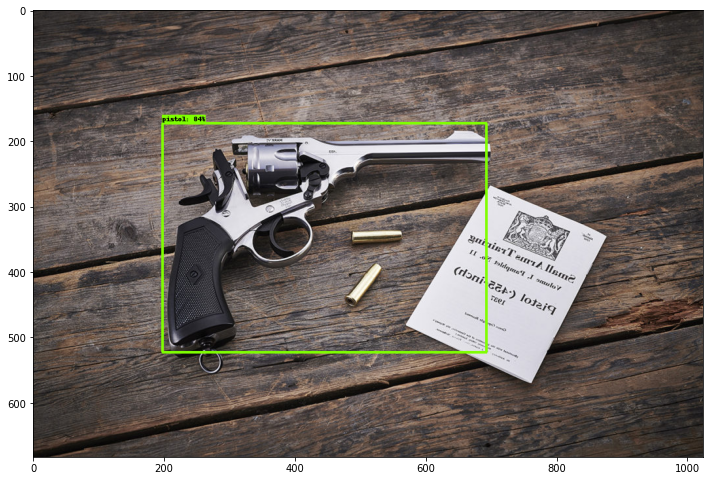

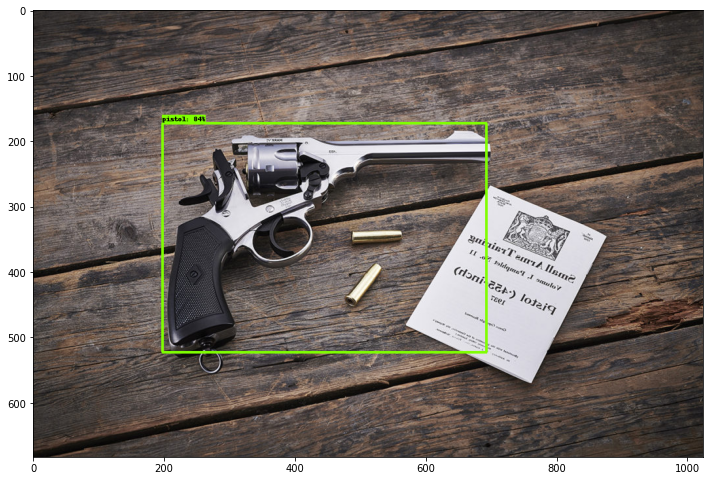

In [ ]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed. 
import random
from email.mime.text import MIMEText
from email.mime.multipart import MIMEMultipart
import smtplib
import mimetypes
import email.mime.application

from google.colab import files

TEST_IMAGE_PATHS = glob.glob('test/test_pistol.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
#image_np = np.tile(
#    np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

if len(detections['num_detections'] >0 ):
  plt.figure(figsize=(12,16))
  plt.imshow(image_np_with_detections)
  plt.savefig("email_fig.jpg")
  files.download("email_fig.jpg")
  filename = "email_fig.jpg"
  marker = "AUNIQUEMARKER"
  # Read a file and encode it into base64 format
  fo = open(filename, "rb")
  msg = MIMEMultipart()
  email_pass = input("Enter password")
  sender_email = "susmitha.m20@gmail.com"  # Enter your address
  receiver_email = "smarripalapu@hawk.iit.edu"  # Enter receiver address
  smtp_ssl_host = 'smtp.gmail.com'  # smtp.mail.yahoo.com
  smtp_ssl_port = 465
  s = smtplib.SMTP_SSL(smtp_ssl_host, smtp_ssl_port)
  s.login(sender_email, email_pass)
  msg['Subject'] = 'Alert CRIME!!'
  msg['From'] = sender_email        #email_user
  msg['To'] = receiver_email
  #file = email.mime.application.MIMEApplication(fo.read(),_subtype=".jpg")
  part = email.mime.application.MIMEApplication(
                fo.read(),
                Name=filename
            )
        # After the file is closed
  part['Content-Disposition'] = 'attachment; filename="%s"' % filename
  msg.attach(part)
  fo.close()
  #attach.add_header('Content-Disposition','attachment',filename=filename)
  #msg.attach(file)
  s.send_message(msg)


plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()



In [ ]:
from google.colab.patches import cv2_imshow
import cv2
#import skvideo.io
def detect_img(path):
  image_np = np.array(path)

  # Things to try:
  # Flip horizontally
  # image_np = np.fliplr(image_np).copy()

  # Convert image to grayscale
  # image_np = np.tile(
  #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

  input_tensor = tf.convert_to_tensor(
      np.expand_dims(image_np, 0), dtype=tf.float32)
  detections, predictions_dict, shapes = detect_fn(input_tensor)

  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=10,
        min_score_thresh=.5,
        agnostic_mode=False,
  )
  return image_np_with_detections


# Set output video writer with codec
# Took 4m 13s to process video 1
# Took 2m 32 sec for video2
# Took 4m 6 sec for video4
fourcc = cv2.VideoWriter_fourcc(*'DIVX')
testfile = 'test/video2.mp4'
testOutput = 'test/Output/testvideo2.avi'
# Read the video
vidcap = cv2.VideoCapture(testfile)
width = int(vidcap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(testOutput,fourcc, 15, (width, height))
vidcap.set(cv2.CAP_PROP_POS_MSEC,1000)  
frame_read, image = vidcap.read()
count = 0
out_img=[]

# Check if camera opened successfully

if (vidcap.isOpened() == False):

  print("Unable to read camera feed")

# Iterate over frames and pass each for prediction
while frame_read:
  # Perform object detection and add to output file
  output_file = detect_img(image)
  # Write frame with predictions to video
  out_img.append(output_file)
  out.write(output_file)
  #cv2_imshow(output_file)
  # Read next frame
  # Wait for 'q' key to stop the program 
  if cv2.waitKey(1) & 0xFF == ord('q'):
      break
  frame_read, image = vidcap.read()
  count += 1

 # Writes the the output image sequences in a video file
#skvideo.io.vwrite("test/Output/outpy.mp4", out_img)
vidcap.release()
# Release video file when we're ready
out.release()


In [ ]:
#Helper functions for webcam capture

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [ ]:
# TAKING PICTURE FROM WEBCAM
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

  # get photo data
  data = eval_js('takePhoto({})'.format(quality))
  # get OpenCV format image
  img = js_to_image(data) 
  print(type(img))
  input_tensor = tf.convert_to_tensor(
      np.expand_dims(img, 0), dtype=tf.float32)
  detections, predictions_dict, shapes = detect_fn(input_tensor)

  label_id_offset = 1
  image_np_with_detections = img.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
  )
   # save image
  cv2.imwrite(filename, img)
  plt.figure(figsize=(12,16))
  plt.imshow(image_np_with_detections)
  plt.show()

  return filename


In [ ]:
try:
  filename = take_photo('/test/photo.jpg')
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0 
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    frame = js_to_image(js_reply["img"])
    input_tensor = tf.convert_to_tensor(
      np.expand_dims(frame, 0), dtype=tf.float32)
    detections, predictions_dict, shapes = detect_fn(input_tensor)
     # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)
    label_id_offset = 1
    image_with_detections = frame.copy()
    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_with_detections,
        detections['detection_boxes'][0].numpy(),
        (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.5,
        agnostic_mode=False,
    )
    ''' # call our darknet helper on video frame
    detections, width_ratio, height_ratio = darknet_helper(frame, width, height)

    # loop through detections and draw them on transparent overlay image
    for label, confidence, bbox in detections:
      left, top, right, bottom = bbox2points(bbox)
      left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
      bbox_array = cv2.rectangle(bbox_array, (left, top), (right, bottom), class_colors[label], 2)
      bbox_array = cv2.putText(bbox_array, "{} [{:.2f}]".format(label, float(confidence)),
                        (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        class_colors[label], 2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes'''

<IPython.core.display.Javascript object>